# Interactive Heat Island Analysis in Yuma, Arizona

This notebook demonstrates an interactive workflow for analyzing the Urban Heat Island (UHI) effect using `OSMSatLab`.  
We will load satellite imagery (Sentinel-2) and Land Surface Temperature (LST) data, visualize changes over time, and calculate correlations between vegetation/built-up areas and temperature.

In [2]:
#pip install osmsatlab
from osmsatlab import OSMSatLab
from shapely.geometry import shape as shp_shape
from osmsatlab.core import OSMSatLab
from osmsatlab.viz.units import analysis_units
from osmsatlab.viz.choropleth import plot_choropleth
import geopandas as gpd
import requests
import matplotlib.pyplot as plt
from IPython.display import Image

## 1. Initialize the Laboratory

We start by initializing `OSMSatLab` for our target city, **Yuma, Arizona**. We also preload population data for year 2020 to set up the spatial context.

In [3]:
lab_Yuma = OSMSatLab(city="Yuma, Arizona", load_population_year=2020)

Successfully located 'Yuma, Arizona'


Loading population (2020):   0%|          | 0/1 [00:00<?, ?it/s]C:\Users\darey\OneDrive - University of Twente\Documents\osmsatlab\osmsatlab\src\osmsatlab\io\population.py:66: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection['overlap_area'] = intersection.geometry.area
Loading population (2020): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

C:\Users\darey/.cache/osmsatlab/worldpop\usa_ppp_2020_1km_Aggregated.tif


## 2. Load Satellite Data

### 2.1 Load Land Surface Temperature (LST)
We fetch MODIS temperature data for January 2023 to June 2023. This data will be used to analyze heat patterns.

In [4]:
lab_Yuma.load_satellite_data(
    source="temperature",
    start_date="2023-01-01",
    end_date="2023-06-01",
)

Fetching temperature data from 2023-01-01 to 2023-06-01...
Using EPSG:32611
Found 298 MODIS scenes
[#############################           ] | 74% Completed | 11.15 ss

c:\Users\darey\AppData\Local\pypoetry\Cache\virtualenvs\osmsatlab-uWzLvEYP-py3.11\Lib\site-packages\dask\array\reductions.py:325: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)


[########################################] | 100% Completed | 14.61 s


<xarray.DataArray 'stackstac-31bd7faf1500b642984aad0d2972c40c' (time: 23,
                                                                band: 1, y: 30,
                                                                x: 23)> Size: 127kB
array([[[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan]]],


       [[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
...
          56.58142857, 56.59571429],
         [        nan,         nan,         nan, ..., 56.49857143,
          56.69285714, 56.61285714],
         [        nan,         nan,         nan, ..., 56.65285714,
          56.78714286, 56.76428571]]],


       [[[        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         [        nan,         nan,         nan, ...,         nan,
                  nan,         nan],
         ...,
         [        nan,         nan,         nan, ..., 52.        ,
          51.925     , 52.025     ],
         [        nan,         nan,         nan, ..., 51.965     ,
          51.98      , 52.12      ],
         [        nan,         nan,         nan, ..., 52.085     ,
          52.275     , 52.255     ]]]], shape=(23, 1, 30, 23))
Coordinates: (12/16)
  * time                   (time) datetime64[ns] 184B 2023-01-01 ... 2023-06-04
  * band                   (band) <U11 44B 'LST_Day_1km'
  * y                      (y) float64 240B 3.625e+06 3.624e+06 ... 3.596e+06
  * x                      (x) float64 184B 7.16e+05 7.17e+05 ... 7.38e+05
    modis:horizontal-tile  int64 8B 8
    proj:transform         object 8B {0.0, -926.6254331383334, -11119505.1976...
    ...                     ...
    proj:wkt2              <U424 2kB 'PROJCS["unnamed",GEOGCS["Unknown datum ...
    proj:geometry          object 8B {'type': 'Polygon', 'coordinates': [[[-1...
    raster:bands           object 8B {'unit': 'Kelvin', 'scale': 0.02, 'data_...
    title                  <U47 188B 'Daily daytime 1km grid Land-surface Tem...
    epsg                   int64 8B 32611
    spatial_ref            int64 8B 0
Attributes:
    spec:        RasterSpec(epsg=32611, bounds=(716000, 3595000, 739000, 3625...
    resolution:  1000
    units:       Celsius
    collection:  modis-11A1-061
    layer:       LST_Day_1km

### 2.2 Load Sentinel-2 Imagery
Next, we fetch high-resolution optical imagery from Sentinel-2 for the same period.  
We enable `add_ndvi` (Normalized Difference Vegetation Index) and `add_ndbi` (Normalized Difference Built-up Index) to calculate vegetation and built-up indices automatically.

In [5]:
lab_Yuma.load_satellite_data(
    source="sentinel2",
    start_date="2023-01-01",
    end_date="2023-06-01",
    cloud_cover_max=10,
    min_coverage=80,
    add_ndvi=True,
    add_ndbi=True,
    composite_period="1W",
    mask_clouds=True
)

Fetching sentinel2 data from 2023-01-01 to 2023-06-01...
Found 196 candidate Sentinel-2 scenes
Using EPSG:32611 for projection
Filtering scenes: Cloud < 10%, Coverage >= 80%...
Computing local cloud stats (optimized)...
[########################################] | 100% Completed | 9.15 ss
Retained 39 scenes after local filtering (max 10%)
Compositing data over 1W using median...
[########################################] | 100% Completed | 11m 8ss


<xarray.DataArray 'stackstac-a11e24ef75c49971f678e6e5c6335fa6' (time: 21,
                                                                band: 6,
                                                                y: 2858, x: 2185)> Size: 6GB
array([[[[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
...
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],

        [[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]]]], shape=(21, 6, 2858, 2185))
Coordinates:
  * time         (time) datetime64[ns] 168B 2023-01-15 2023-01-22 ... 2023-06-04
  * band         (band) object 48B 'B02' 'B03' 'B04' 'B08' 'NDVI' 'NDBI'
  * y            (y) float64 23kB 3.624e+06 3.624e+06 ... 3.596e+06 3.596e+06
  * x            (x) float64 17kB 7.169e+05 7.169e+05 ... 7.388e+05 7.388e+05
    epsg         int64 8B 32611
    spatial_ref  int64 8B 0
Attributes:
    spec:             RasterSpec(epsg=32611, bounds=(716930, 3595890, 738780,...
    resolution:       10
    source:           Microsoft Planetary Computer
    collection:       sentinel-2-l2a
    start_date:       2023-01-01
    end_date:         2023-06-01
    cloud_cover_max:  10
    min_coverage:     80
    mask_clouds:      True
    ndvi_added:       True
    ndbi_added:       True

## 3. Visualize Changes Over Time

We can create time-lapse animations to visualize how the area changes.  
Here, we generate an RGB (True Color), NDVI, NDBI, and temperature animations.

Generating animation with 21 frames...
Saved animation to rgb_timelapse.gif


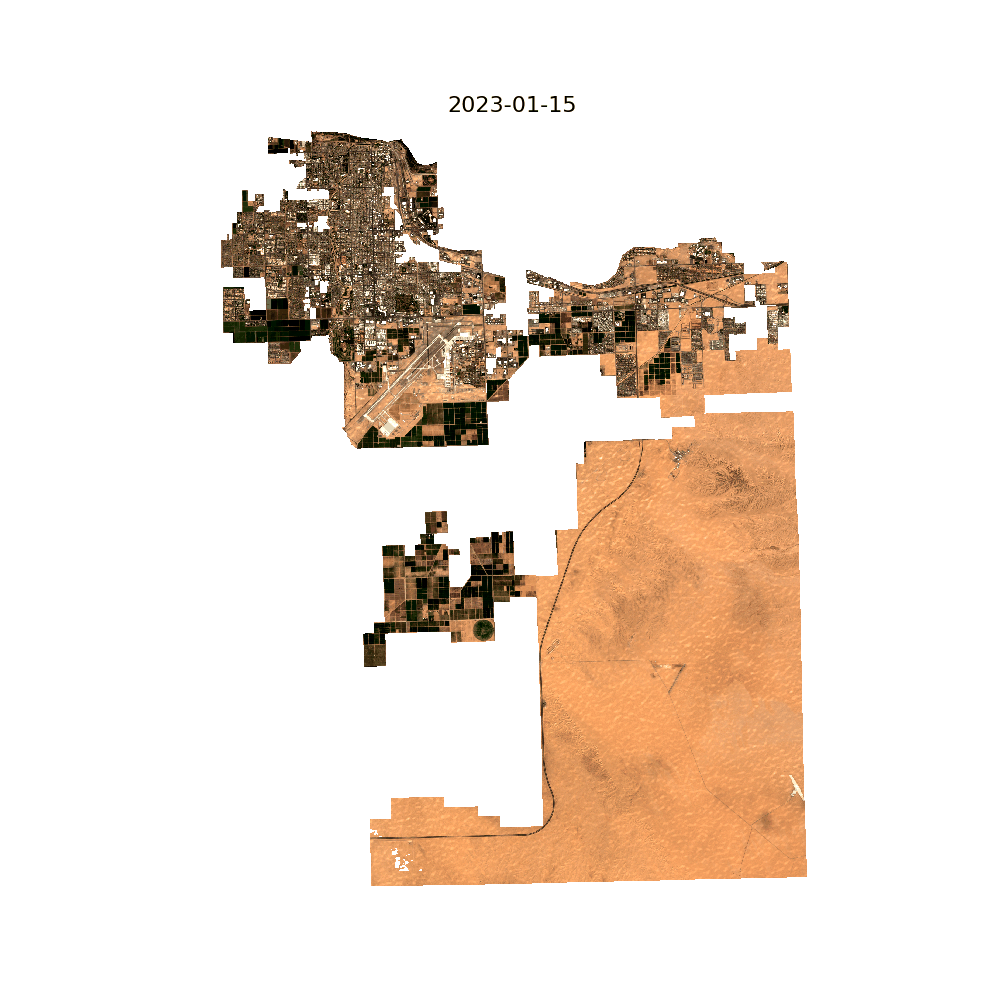

In [6]:
lab_Yuma.animate(
    source="sentinel2", 
    output_path="rgb_timelapse.gif",
    bands=["B04", "B03", "B02"],       # <--- Select the specific band        # or 'RdBu_r' for contrast
    fps=5,
    add_text=True
)
Image(filename="rgb_timelapse.gif")

Generating animation with 21 frames...
Saved animation to ndbi_timelapse.gif


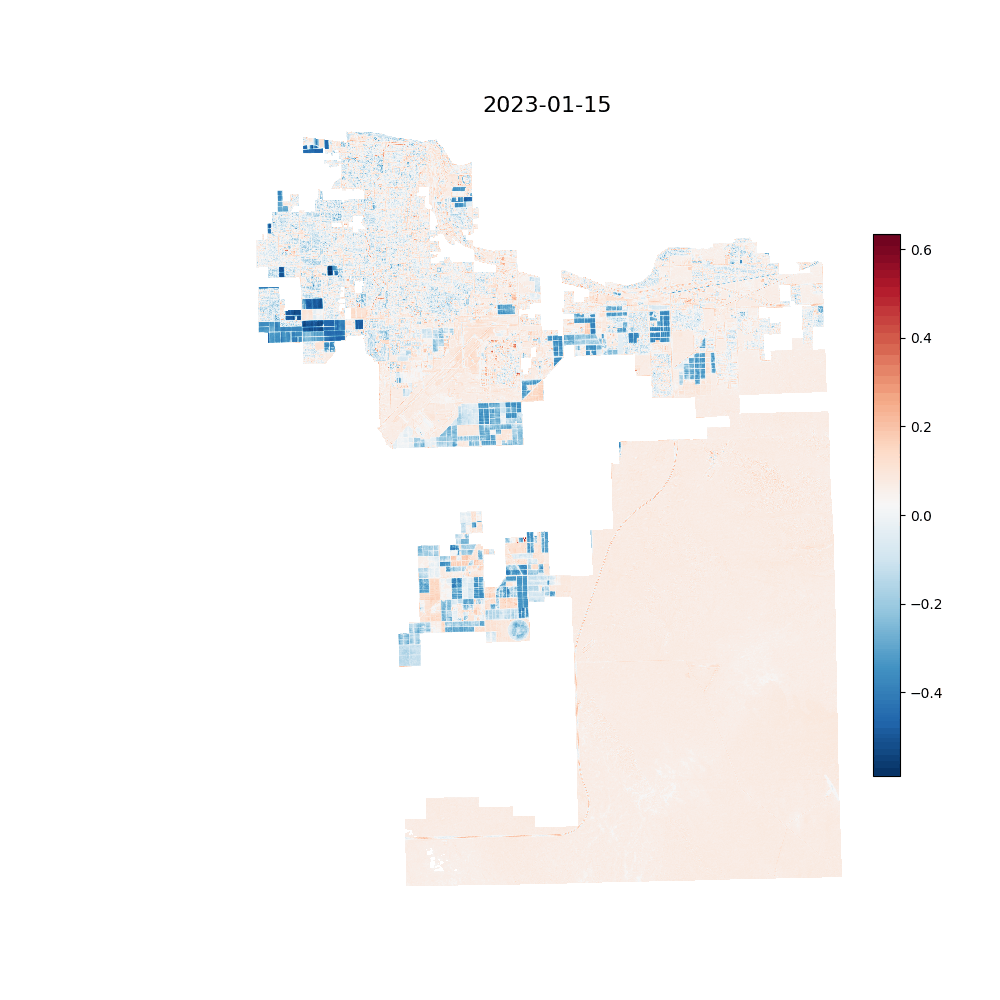

In [7]:
lab_Yuma.animate(
    source="sentinel2", 
    output_path="ndbi_timelapse.gif",
    bands=["NDBI"],       # <--- Select the specific band
    cmap="RdBu_r",         # or 'RdBu_r' for contrast
    fps=5,
    add_text=True
)
Image(filename="ndbi_timelapse.gif")


Generating animation with 21 frames...
Saved animation to ndvi_timelapse.gif


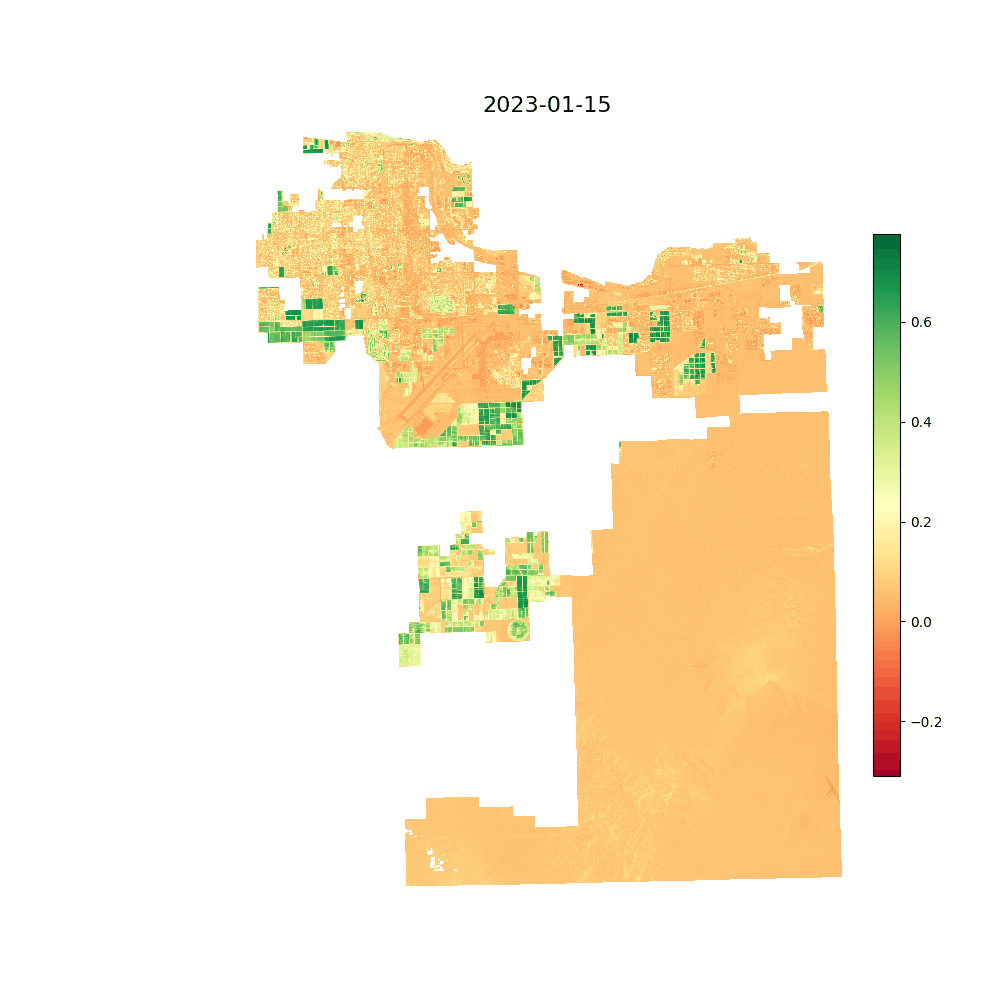

In [8]:
lab_Yuma.animate(
    source="sentinel2", 
    output_path="ndvi_timelapse.gif",
    bands=["NDVI"],       # <--- Select the specific band
    cmap="RdYlGn",         # or 'RdBu_r' for contrast
    fps=5,
    add_text=True
)
Image(filename="ndvi_timelapse.gif")

Generating animation with 23 frames...
Saved animation to temperature_timelapse.gif


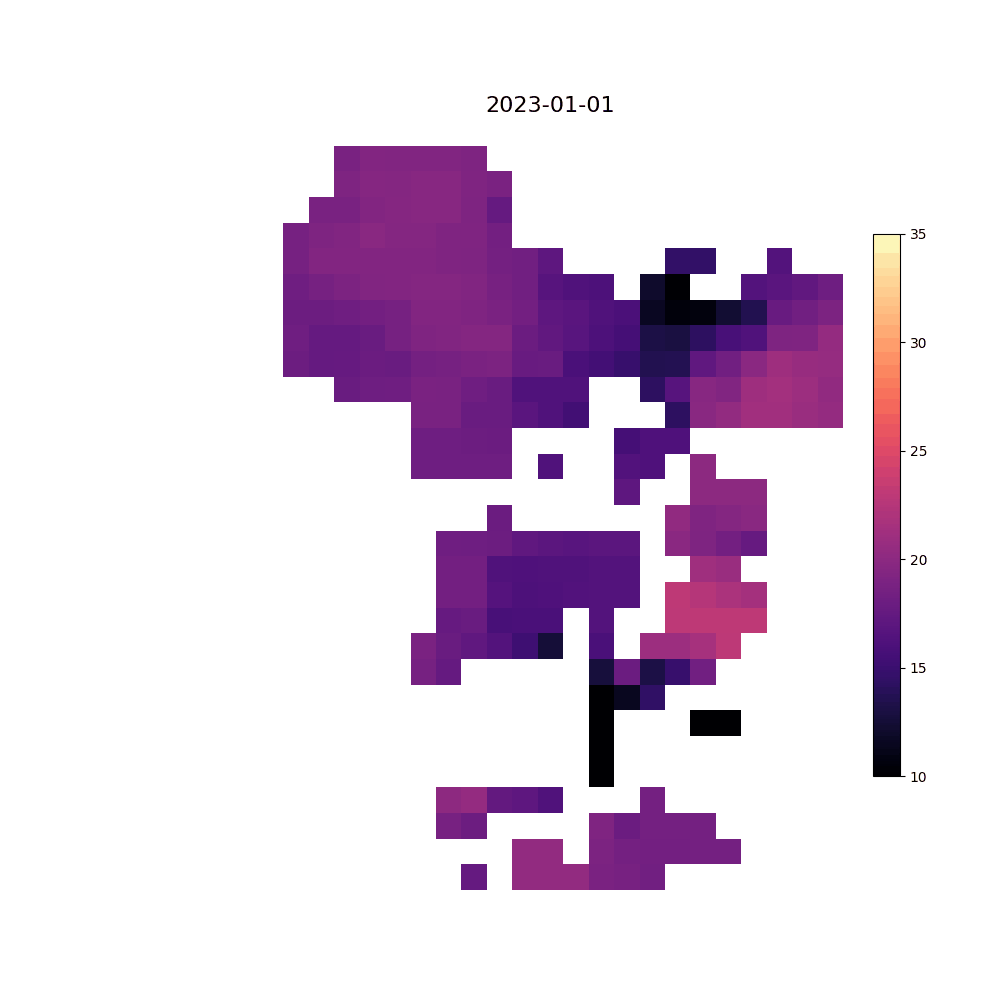

In [9]:
lab_Yuma.animate(
    source="temperature", 
    output_path="temperature_timelapse.gif",
    cmap="magma",         # or 'RdBu_r' for contrast
    vmin=10, vmax=35,
    fps=5,
    add_text=True
)
Image(filename="temperature_timelapse.gif")

## 5. Heat Exposure Index Analysis

We can quantify heat exposure by combining Land Surface Temperature (LST) with population density. The 
calculate_heat_exposure
 method fetches both datasets, aligns them spatially, and computes a normalized index ($0$ to $1$) where high values indicate areas with both high temperatures and high population density.

Reusing loaded temperature data (4 steps covered)...
Using pre-loaded LST data.
Fetching WorldPop Population (2020)...


C:\Users\darey\OneDrive - University of Twente\Documents\osmsatlab\osmsatlab\src\osmsatlab\io\population.py:66: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection['overlap_area'] = intersection.geometry.area


C:\Users\darey/.cache/osmsatlab/worldpop\usa_ppp_2020_1km_Aggregated.tif
Reducing LST time series to mean image...
Aligning population raster to LST grid...
Applying robust normalization (2nd-98th percentile)...


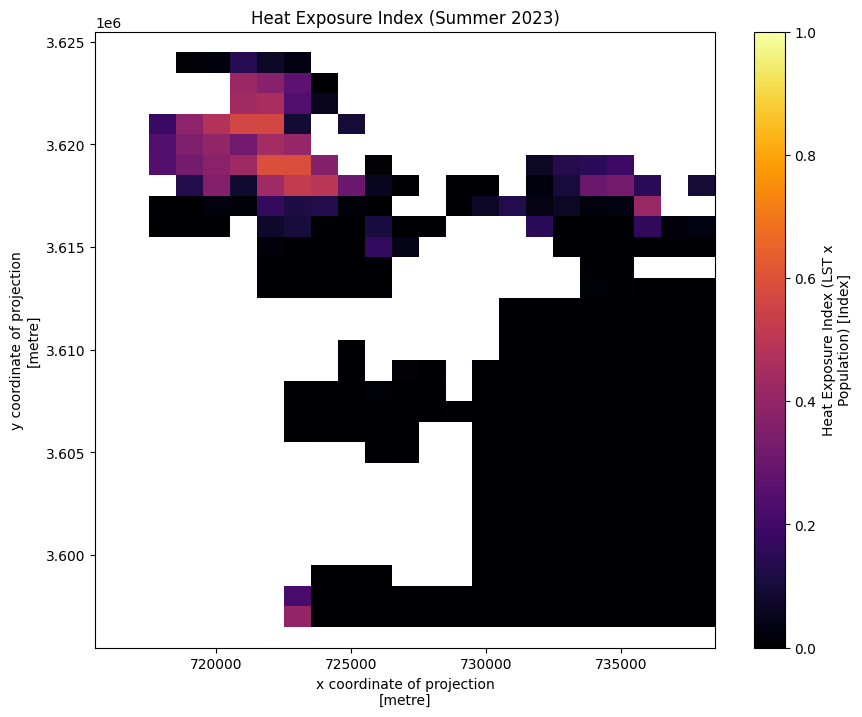

In [10]:
heat_exposure_Yuma = lab_Yuma.calculate_heat_exposure(
    start_date="2023-05-01",
    end_date="2023-06-01",
)

plt.figure(figsize=(10, 8))
heat_exposure_Yuma.plot(cmap="inferno", vmin=0, vmax=1)
plt.title("Heat Exposure Index (Summer 2023)")
plt.show()


## 5. Temporal Temperature Analysis

We can calculate and plot the **median temperature** over a longer period (2023-2025) to observe seasonal trends. This aggregates data weekly (`1W`).

Loaded data does not fully cover requested range. Fetching fresh data...
Fetching MODIS LST from 2023-01-01 to 2025-01-01...
Using EPSG:32611
Found 1461 MODIS scenes
[########################################] | 100% Completed | 65.23 s
Aggregating temperature data: 1W Median...


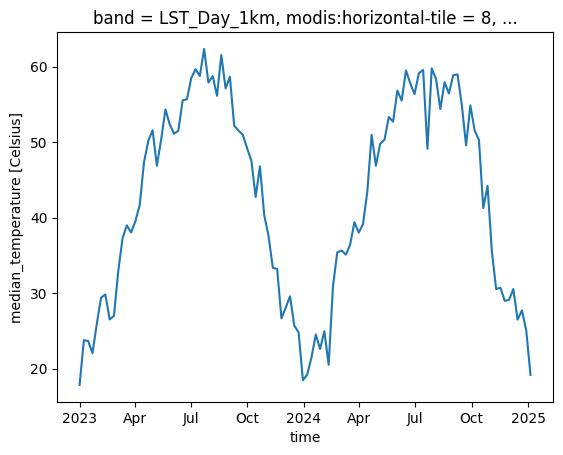

In [11]:
median_temperature_Yuma = lab_Yuma.calculate_temporal_temperature(
    start_date="2023-01-01", 
    end_date="2025-01-01", 
    aggregation="1W" # '1W', '2W', '1M' etc.
)
# Returns a DataArray with time steps: 2023-01-01, 2023-01-08...
median_temperature_Yuma.mean(dim=["x", "y"]).plot()

## 6. Correlation Analysis

Finally, we analyze the relationship between surface characteristics and temperature.  

### 6.1 Temperature vs. Vegetation (NDVI)
Does more vegetation lead to cooler temperatures? We calculate the correlation coefficient ($r$).

Reusing loaded temperature data for correlation (5 steps)...
Using pre-loaded LST data.
Fetching Sentinel-2 bands for NDVI...
Found 36 candidate Sentinel-2 scenes
Using EPSG:32611 for projection
Filtering scenes: Cloud < 30%, Coverage >= 0%...
Computing local cloud stats (optimized)...
[########################################] | 100% Completed | 1.80 sms
Retained 7 scenes after local filtering (max 30%)
[########################################] | 100% Completed | 48.87 s
Creating Sentinel-2 Composite (Median)...
Calculating NDVI...
Aligning grids (Resampling Index to match LST)...
Computing Correlation on 304 pixels (Tensor=True)...
Correlation Coefficient (r): -0.3890
Correlation (Temperature vs NDVI): -0.38897659375281174


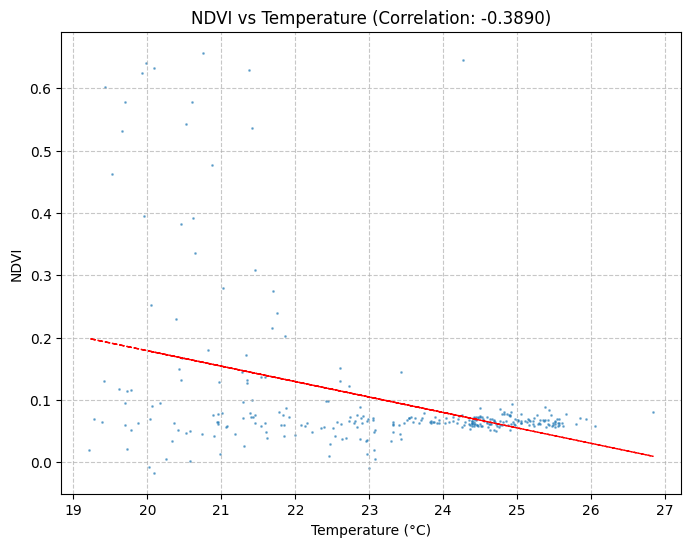

In [12]:
r_value_ndvi = lab_Yuma.calculate_correlation("NDVI", "2023-01-01", "2023-02-01", tensor=True)
print(f"Correlation (Temperature vs NDVI): {r_value_ndvi}")

### 6.2 Temperature vs. Built-up Area (NDBI)
Does more concrete/urban area lead to higher temperatures?

Reusing loaded temperature data for correlation (5 steps)...
Using pre-loaded LST data.
Fetching Sentinel-2 bands for NDBI...
Found 36 candidate Sentinel-2 scenes
Using EPSG:32611 for projection
Filtering scenes: Cloud < 30%, Coverage >= 0%...
Computing local cloud stats (optimized)...
[########################################] | 100% Completed | 1.63 sms
Retained 7 scenes after local filtering (max 30%)
[########################################] | 100% Completed | 36.48 s
Creating Sentinel-2 Composite (Median)...
Calculating NDBI...
Aligning grids (Resampling Index to match LST)...
Computing Correlation on 304 pixels (Tensor=False)...
Correlation Coefficient (r): 0.4589
Correlation (Temperature vs NDBI): 0.4588933506793147


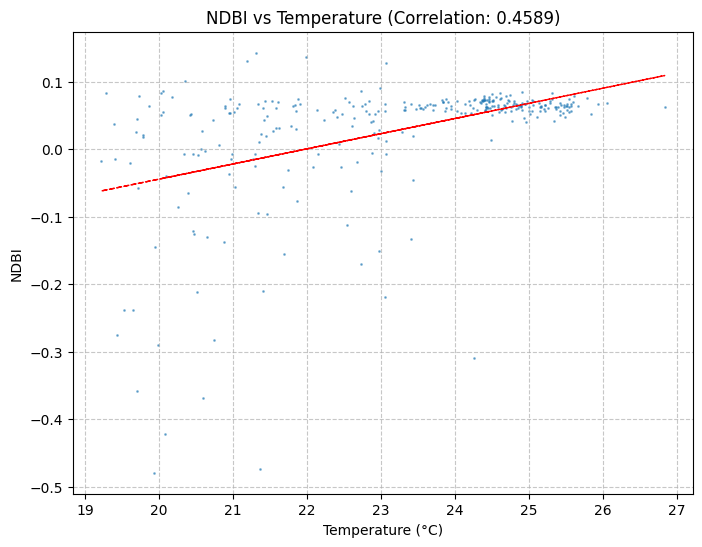

In [13]:
r_value_ndbi = lab_Yuma.calculate_correlation("NDBI", "2023-01-01", "2023-02-01", tensor=False)
print(f"Correlation (Temperature vs NDBI): {r_value_ndbi}")

## 7. Integrated Vulnerability Analysis (Heat + Access)

We can perform a comprehensive vulnerability assessment by combining environmental factors (Heat Exposure Index) with social infrastructure (Accessibility to Healthcare). The 
calculate_heat_access_vulnerability
 method integrates these disparate data types by:

1. Aggregating the raster-based Heat Exposure Index into vector analysis units (e.g., municipalities) using zonal statistics.

2. Calculating accessibility metrics (median distance to healthcare) for each unit.

3. Combining these metrics into a single Vulnerability Score using a weighted sum (implemented with PyTorch tensors for performance).
This identifies areas that suffer from both high heat exposure and poor access to essential services.

Loading population (2020):   0%|          | 0/1 [00:00<?, ?it/s]C:\Users\darey\OneDrive - University of Twente\Documents\osmsatlab\osmsatlab\src\osmsatlab\io\population.py:66: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection['overlap_area'] = intersection.geometry.area
Loading population (2020): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


C:\Users\darey/.cache/osmsatlab/worldpop\nld_ppp_2020_1km_Aggregated.tif


C:\Users\darey\OneDrive - University of Twente\Documents\osmsatlab\osmsatlab\src\osmsatlab\io\population.py:66: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection['overlap_area'] = intersection.geometry.area


Fetching MODIS LST from 2023-06-01 to 2023-06-30...
Using EPSG:32631
Found 60 MODIS scenes
[########################################] | 100% Completed | 2.78 sms
Fetching WorldPop Population (2020)...
C:\Users\darey/.cache/osmsatlab/worldpop\nld_ppp_2020_1km_Aggregated.tif
Reducing LST time series to mean image...
Aligning population raster to LST grid...
Applying robust normalization (2nd-98th percentile)...


C:\Users\darey\OneDrive - University of Twente\Documents\osmsatlab\osmsatlab\src\osmsatlab\io\population.py:66: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  intersection['overlap_area'] = intersection.geometry.area


   unit_id       unit_name  heat_exposure_index_mean  access_median  \
0        0       De Wolden                       NaN            NaN   
1        1      Twenterand                  0.098811    2324.787248   
2        2      Westerveld                       NaN            NaN   
3        3  Rijssen-Holten                  0.118747    2646.382230   
4        4      Olst-Wijhe                  0.025031    5033.113742   

   population_sum  vulnerability_score  
0             NaN                  NaN  
1    33438.730469             0.203593  
2             NaN                  NaN  
3    38825.566406             0.250116  
4    18246.105469             0.247715  


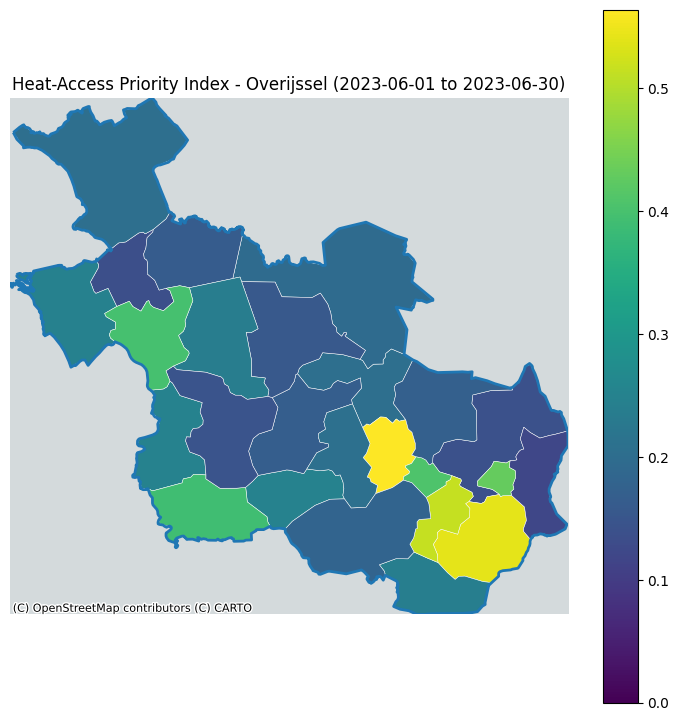

In [14]:


# Overijssel boundary
overijssel_url = "https://apitestbed.geonovum.nl/joins_pygeoapi/collections/nl-provinces/items/b7805978-1c97-5152-a6a4-46e8d8f37c1c?f=json"
overijssel_geojson = requests.get(overijssel_url).json()
overijssel_geom = shp_shape(overijssel_geojson["geometry"])

# Lab setup
lab = OSMSatLab(custom_geometry=overijssel_geom, crs="EPSG:28992", load_population_year=2020, load_services=False)

# Fetch a service category for access (choose one)
lab.fetch_services(tags={"amenity": ["hospital", "clinic", "doctors", "pharmacy"]}, category_name="healthcare")

# Units (LAU in NL)
units, aoi, iso3 = analysis_units(lab, grid_cell_m=1000)

# Time window
start_date = "2023-06-01"
end_date = "2023-06-30"

# Compute combined score
out_units = lab.calculate_heat_access_vulnerability(
    units_gdf=units,
    service_category="healthcare",
    start_date=start_date,
    end_date=end_date,
    threshold=1000,
    metric_type="euclidean",
    year=2020,
    weights=(0.5, 0.4, 0.1),
    use_torch=True,
)

print(out_units[["unit_id", "unit_name", "heat_exposure_index_mean", "access_median", "population_sum", "vulnerability_score"]].head())

# Plot vulnerability as choropleth
plot_choropleth(
    out_units,
    column="vulnerability_score",
    title=f"Heat-Access Priority Index - Overijssel ({start_date} to {end_date})",
    aoi=aoi,
    log1p=False
)

# Save outputs
out_units.to_file("Heat-Access Priority Index.geojson", driver="GeoJSON")
plt.savefig("Heat-Access Priority Index.png", dpi=200, bbox_inches="tight")
plt.show()


## 8. Accessing Data within the Lab Object
The 
OSMSatLab
 instance (e.g., lab_Yuma) acts as a central container for all your analysis data. You can directly access the raw dataframes and arrays for custom plotting or further analysis.

Attributes:

* **lab_Yuma.population**: The population GeoDataFrame.
* **lab_Yuma.services**: A dictionary storing service locations (e.g., ['healthcare']).
* **lab_Yuma.satellite_data**: A dictionary storing fetched raster data (e.g., ['temperature'], ['sentinel2']).

In [15]:
lab_Yuma.fetch_services(tags={"amenity": ["hospital", "clinic", "doctors", "pharmacy"]}, category_name="healthcare")
# 1. Inspect the Population Data
print("Population Data:")
print(lab_Yuma.population.head(5))

# 2. Inspect Healthcare Services
if "healthcare" in lab_Yuma.services:
    print("\nHealthcare Locations:")
    print(lab_Yuma.services["healthcare"].head(5))

# 3. Access Raw Satellite Data (xarray.DataArray)
if "temperature" in lab_Yuma.satellite_data:
    lst_data = lab_Yuma.satellite_data["temperature"]
    print(f"\nSatellite Data (Temperature): {lst_data.sizes}")

if "sentinel2" in lab_Yuma.satellite_data:
    lst_data = lab_Yuma.satellite_data["sentinel2"]
    print(f"\nSatellite Data (Sentinel2): {lst_data.sizes}")

Population Data:
    population                           geometry
0   116.156342  POINT (-12764310.214 3859355.167)
1   258.082367  POINT (-12763382.551 3859355.167)
2   871.840210  POINT (-12762454.889 3859355.167)
3  1519.764160  POINT (-12761527.226 3859355.167)
4   859.868530  POINT (-12760599.564 3859355.167)

Healthcare Locations:
                                             geometry addr:city  \
element id                                                        
node    359260360   POINT (-12761121.248 3853257.478)      Yuma   
        2499120899  POINT (-12762743.775 3853313.596)      Yuma   
        4520241243  POINT (-12757941.864 3856195.845)       NaN   
        4693022572  POINT (-12760555.567 3853348.843)       NaN   
        4706010048    POINT (-12760067.097 3852397.2)       NaN   

                   addr:housenumber addr:postcode addr:state  \
element id                                                     
node    359260360              2400         85364         AZ  